In [0]:
# autoencoders are a type of ann used mainly to perform data encoding (representation learning)
# comprises of 2 ann networks : encoder and decoder - we use same data for encoder input and decoder output.

In [0]:
# autoencoders work by adding a bottleneck in the network (bottleneck is the middle code layer between encoder and decoder). 
# This bottleneck forces the network to create a compressed/encoded version of the original output.
# autoencoders work well if correlations exist between input data and performs poorlt if input data is independent.

In [0]:
# encoder :-
# h(x) = sigmoid(w1 * x + b)

# decoder :-
# y = sigmoid(w2 * h(x) + c)

# tied weights :-
# weights from input to hidden layer will be equal to the weights from hidden to output layer.
# transpose(w1) = w2

APPLICATIONS OF AUTOENCODERS

In [0]:
# 1. Image de-noising - instead of feeding in the exact same data at input and output, we feed in a noisy image and then set the target to be the original image.

# 2. Image compression - the bottleneck layer contains the encoded image data.

# 3. Image search - take the encoded versions of the dog image database(all images) and compare it with a new dog image to see if it is a match.

# 4. Anomaly detection - eg : credit card fraud detection -  we train autoencoders on proper(non-fraudulent) transactions only. 
# This way, the network is now capable of reconstructing the input with good 
# reconstruction loss. If we feed in fraudulent transaction, the reconstruction loss will be high - can set a threshold to perform anomaly detection.

VARIATIONAL AUTOENCODERS

In [0]:
# a major issue with regular autoencoders is that the latent space that the inputs are converted to are discrete (not continuous) and does not allow for an easy
# interpolation. The generative part of the autoencoder works by randomly picking samples from the latent space which is challenging if it is discontinuous or has gaps.
# VAEs solve this issue. They have a continuous latent space by default which makes them super powerful in generating new images. In VAE, the encoder doesnt generate just one 
# vector of size n but generates 2 vectors instead : 1. mean vector (mu) and standard dev vector (sigma). The decoder samples from this distribution. 

# example of VAE use - steps to apply glasses to a face - 1. encode a face with glasses 2.encode a face without glasses 3. subtract the 2 to obtain an encoded version of glasses
# alone 4 add this encoded glass to a face.

# NOISE REMOVAL PROJECT

SETUP

In [6]:
!pip uninstall tensorflow

Uninstalling tensorflow-1.15.0:
  Would remove:
    /usr/local/bin/estimator_ckpt_converter
    /usr/local/bin/freeze_graph
    /usr/local/bin/saved_model_cli
    /usr/local/bin/tensorboard
    /usr/local/bin/tf_upgrade_v2
    /usr/local/bin/tflite_convert
    /usr/local/bin/toco
    /usr/local/bin/toco_from_protos
    /usr/local/lib/python3.6/dist-packages/tensorflow-1.15.0.dist-info/*
    /usr/local/lib/python3.6/dist-packages/tensorflow/*
    /usr/local/lib/python3.6/dist-packages/tensorflow_core/*
Proceed (y/n)? y
  Successfully uninstalled tensorflow-1.15.0


In [7]:
!pip install tensorflow==2.0.0

     |████████████████████████████████| 86.3MB 51kB/s 
     |████████████████████████████████| 450kB 34.7MB/s 
     |████████████████████████████████| 3.8MB 60.6MB/s 
  Found existing installation: tensorflow-estimator 1.15.1
    Uninstalling tensorflow-estimator-1.15.1:
      Successfully uninstalled tensorflow-estimator-1.15.1
  Found existing installation: tensorboard 1.15.0
    Uninstalling tensorboard-1.15.0:
      Successfully uninstalled tensorboard-1.15.0


In [8]:
import tensorflow as tf
tf.__version__

'2.0.0'

In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [0]:
import seaborn as sns
import random

LOAD DATASET

In [0]:
from tensorflow.keras.datasets import mnist

In [12]:
(X_train, y_train),(X_test, y_test) = mnist.load_data()

11493376/11490434 [==============================] - 0s 0us/step


DATA VISUALIZATION

In [13]:
X_train.shape

(60000, 28, 28)

In [14]:
X_test.shape

(10000, 28, 28)

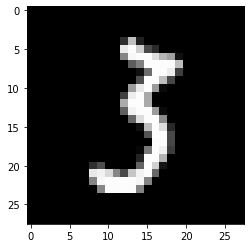

In [15]:
i = random.randint(0, 60000)
plt.imshow(X_train[i], cmap='gray')

In [16]:
label = y_train[i]
label

3

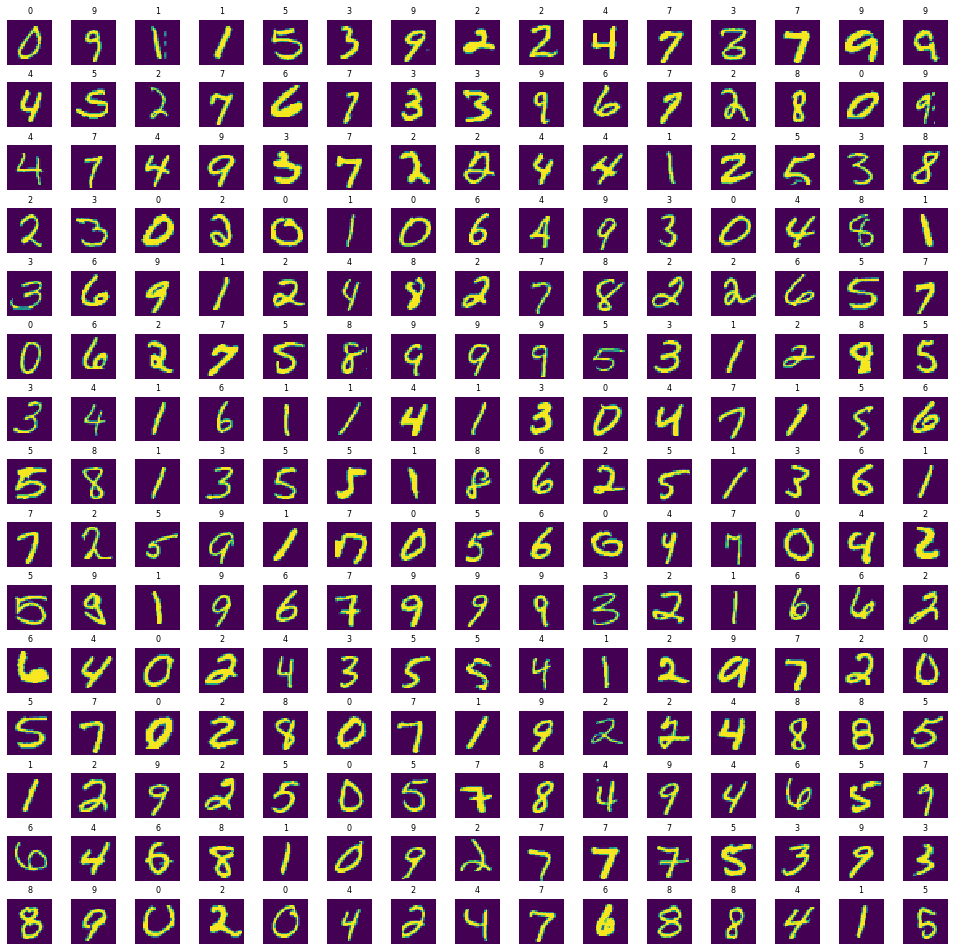

In [17]:
W_grid = 15
L_grid = 15
# fig, axes = plt.subplots(L_grid, W_grid)
# subplots() returns the figure object and axes object
# we can use the axes object to plot specific figures at various locations
fig, axes = plt.subplots(L_grid, W_grid, figsize = (17,17))
axes = axes.ravel() # flaten the 15 x 15 matrix into 225 array
n_training = len(X_train) # get the length of the training dataset

for i in np.arange(0, W_grid * L_grid): # create evenly spaces variables 
    # Select a random number
    index = np.random.randint(0, n_training)
    # read and display an image with the selected index    
    axes[i].imshow( X_train[index] )
    axes[i].set_title(y_train[index], fontsize = 8)
    axes[i].axis('off')

plt.subplots_adjust(hspace=0.4)


ADD SOME NOISE TO DATASET

In [0]:
# normalize the data
X_train = X_train/255
X_test = X_test/255

In [19]:
added_noise = np.random.randn(*(28,28)) # create some noise with same dimension as original input image (28*28)
added_noise.shape

(28, 28)

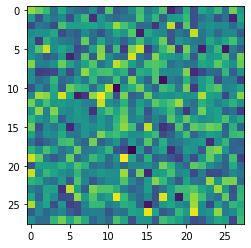

In [20]:
noise_factor = 0.3
added_noise = noise_factor * np.random.randn(*(28,28))
plt.imshow(added_noise)

In [0]:
# add this noise to the original image
sample_image = X_train[10]
noise_factor = 0.1
noisy_image_sample = sample_image + noise_factor * np.random.randn(*(28,28))

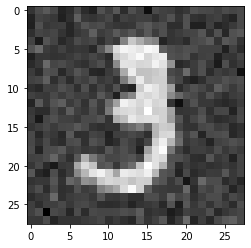

In [22]:
plt.imshow(noisy_image_sample, cmap = 'gray')

In [23]:
noisy_image_sample.max()

1.208888990928911

In [24]:
noisy_image_sample.min()

-0.3808227185939015

In [0]:
# numbers no longer range from 0 to 1. Clip them.
noisy_sample_image = np.clip(noisy_image_sample, 0., 1.)

In [26]:
noisy_sample_image.max(), noisy_sample_image.min()

(1.0, 0.0)

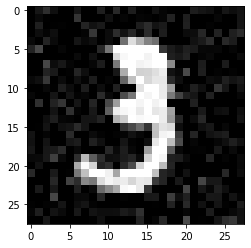

In [27]:
plt.imshow(noisy_sample_image, cmap='gray')

In [0]:
# do the same operation for every image in the dataset
X_train_noisy = []
noise_factor = 0.2

for sample_image in X_train:
  sample_image_noisy = sample_image + noise_factor * np.random.randn(*(28,28))
  sample_image_noisy = np.clip(sample_image_noisy, 0., 1.)
  X_train_noisy.append(sample_image_noisy)

In [29]:
X_train_noisy

[array([[0.        , 0.22261996, 0.20145078, 0.        , 0.19382023,
         0.02234634, 0.        , 0.07753065, 0.06408766, 0.        ,
         0.07598216, 0.02054831, 0.        , 0.07076553, 0.        ,
         0.06922141, 0.12304418, 0.        , 0.        , 0.        ,
         0.11270276, 0.49839598, 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        ],
        [0.0836411 , 0.        , 0.        , 0.17208071, 0.        ,
         0.42590108, 0.04947756, 0.        , 0.01190509, 0.11743418,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.03553379, 0.        , 0.28693877, 0.19934673,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        , 0.2185029 , 0.34842913,
         0.        , 0.05164078, 0.04630305, 0.        , 0.12767961,
         0.13932135, 0.2281456 , 0.        , 0.        , 0.        ,
         0.

In [0]:
# convert list to array
X_train_noisy= np.array(X_train_noisy)

In [31]:
X_train_noisy.shape

(60000, 28, 28)

In [0]:
# do the same for testing data
X_test_noisy = []
noise_factor = 0.4

for sample_image in X_test:
  sample_image_noisy = sample_image + noise_factor * np.random.randn(*(28,28))
  sample_image_noisy = np.clip(sample_image_noisy, 0., 1.)
  X_test_noisy.append(sample_image_noisy)

In [33]:
X_test_noisy = np.array(X_test_noisy)
X_test_noisy.shape

(10000, 28, 28)

BUILD AND TRAIN THE AUTOENCODER DEEP LEARNING MODEL

In [0]:
autoencoder = tf.keras.models.Sequential()

# encoder cn
autoencoder.add(tf.keras.layers.Conv2D(16, (3,3), strides=1, padding='same', input_shape=(28,28,1)))
autoencoder.add(tf.keras.layers.MaxPooling2D((2,2), padding='same'))

autoencoder.add(tf.keras.layers.Conv2D(8, (3,3), strides = 1, padding='same'))
autoencoder.add(tf.keras.layers.MaxPooling2D((2,2), padding='same'))

# encoded image (code layer)
autoencoder.add(tf.keras.layers.Conv2D(8, (3,3), strides=1, padding = 'same'))

# decoder cnn
autoencoder.add(tf.keras.layers.UpSampling2D((2,2)))
autoencoder.add(tf.keras.layers.Conv2DTranspose(8, (3,3), strides = 1, padding='same'))

autoencoder.add(tf.keras.layers.UpSampling2D((2,2)))
autoencoder.add(tf.keras.layers.Conv2DTranspose(1, (3,3), strides=1, activation='sigmoid', padding='same'))

In [37]:
autoencoder.compile(loss='binary_crossentropy', optimizer=tf.keras.optimizers.Adam(lr=0.001))
autoencoder.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 28, 28, 16)        160       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 14, 14, 16)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 14, 14, 8)         1160      
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 7, 7, 8)           0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 7, 7, 8)           584       
_________________________________________________________________
up_sampling2d_1 (UpSampling2 (None, 14, 14, 8)         0         
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 14, 14, 8)        

In [38]:
autoencoder.fit(X_train_noisy.reshape(-1, 28, 28, 1), X_train.reshape(-1, 28, 28, 1), epochs = 10, batch_size=200)

Train on 60000 samples
Epoch 1/10
60000/60000 [==============================] - 44s 737us/sample - loss: 0.2218
Epoch 2/10
60000/60000 [==============================] - 44s 725us/sample - loss: 0.1088
Epoch 3/10
60000/60000 [==============================] - 44s 730us/sample - loss: 0.1011
Epoch 4/10
60000/60000 [==============================] - 43s 721us/sample - loss: 0.0980
Epoch 5/10
60000/60000 [==============================] - 44s 732us/sample - loss: 0.0959
Epoch 6/10
60000/60000 [==============================] - 44s 726us/sample - loss: 0.0941
Epoch 7/10
60000/60000 [==============================] - 44s 727us/sample - loss: 0.0925
Epoch 8/10
60000/60000 [==============================] - 45s 742us/sample - loss: 0.0912
Epoch 9/10
60000/60000 [==============================] - 44s 731us/sample - loss: 0.0900
Epoch 10/10
60000/60000 [==============================] - 46s 767us/sample - loss: 0.0889


EVALUATE THE MODEL

In [40]:
denoised_images = autoencoder.predict(X_test_noisy[:15].reshape(-1, 28, 28, 1))
denoised_images.shape

(15, 28, 28, 1)

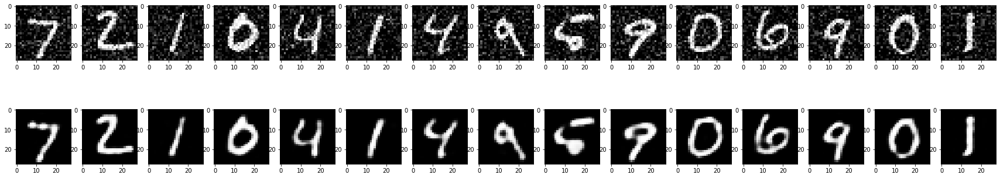

In [41]:
fig, axes = plt.subplots(nrows=2, ncols=15, figsize=(30,6))
for images, row in zip([X_test_noisy[:15], denoised_images], axes):
    for img, ax in zip(images, row):
        ax.imshow(img.reshape((28, 28)), cmap='gray')